In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/amazon-fine-food-reviews/database.sqlite
/kaggle/input/amazon-fine-food-reviews/hashes.txt
/kaggle/input/amazon-fine-food-reviews/Reviews.csv


# Step 1: Read the Dataframe

In [3]:
df = pd.read_csv('/kaggle/input/amazon-fine-food-reviews/Reviews.csv')
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


> **We can see that the dataframe contains some product, user and review information
> The data that we will be using most for this analysis is “ Summary”, “ Text”, and “ Score.”**
> 
> **Text** — This variable contains the complete product review information.
> 
> **Summary** — This is a summary of the entire review.
> 
> **Score** — The product rating provided by the customer.

# Step 2: Data Analysis

**Now, we will take a look at the variable “ Score ” to see if majority of the customer ratings are positive or negative.
**
**To do this, we will have to install the Plotly library first.**

In [4]:
#Imports
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.express as px

In [5]:
# Product Scores
fig = px.histogram(df, x="Score")
fig.update_traces(marker_color="turquoise",marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5)
fig.update_layout(title_text='Product Score')
fig.show()

# From here, we can see that most of the customer rating is positive. This leads me to believe that most reviews will be pretty positive too, which will be analyzed in a while.

Now, we can create some **wordclouds** to see the most frequently used words in the reviews.

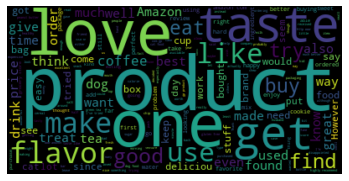

In [6]:
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud

#Creating Stopwords list

stopwords = set(stopwords.words('english'))
stopwords.update(["br","href"])
textt = " ".join(review for review in df.Text)
wordcloud = WordCloud(stopwords=stopwords).generate(textt)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# Some popular words that can be observed here include 
# “taste”, “product” and “love”.
# 
These words are mostly **positive**, also indicating that most reviews in the dataset **express a positive sentiment**.

# Step 3: Classifying Tweets

> In this step, we will classify reviews into “positive” and “negative,” so we can use this as training data for our sentiment classification model.
> 
> Positive reviews will be classified as +1, and negative reviews will be classified as -1.
> 
> We will classify all reviews with ‘Score’ > 3 as +1, indicating that they are positive.
> 
> All reviews with ‘Score’ < 3 will be classified as -1. Reviews with ‘Score’ = 3 will be dropped, because they are neutral. Our model will only classify positive and negative reviews.

In [7]:
# assign reviews with score > 3 as positive sentiment
# score < 3 negative sentiment
# remove score = 3
df = df[df['Score'] != 3]
df['sentiment'] = df['Score'].apply(lambda rating : +1 if rating > 3 else -1)


> Looking at the head of the data frame now, we can see a new column called ‘sentiment:’

In [8]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,sentiment
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,1
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,-1
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,1
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,-1
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,1


# Step 4: More Data Analysis

> Now that we have classified tweets into positive and negative, let’s build wordclouds for each!
> 
> First, we will create two data frames — one with all the positive reviews, and another with all the negative reviews.

In [9]:
# split df - positive and negative sentiment:
positive = df[df['sentiment'] == 1]
negative = df[df['sentiment'] == -1]


In [10]:
positive = positive.dropna()
negative = negative.dropna()

# Wordcloud — Positive Sentiment

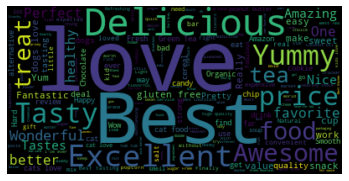

In [11]:
import nltk
from nltk.corpus import stopwords

stopwords = set(stopwords.words('english'))
stopwords.update(["br", "stuff", "href","good","great", "taste", "product", "flavour","like", "coffee", "dog","flavor","buy"]) 
## good and great removed because they were included in negative sentiment
pos = " ".join(review for review in positive.Summary)
wordcloud = WordCloud(stopwords=stopwords).generate(pos)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# Wordcloud - Negative Sentiment

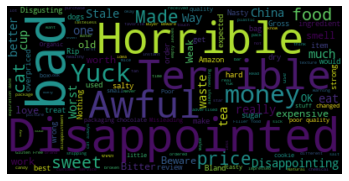

In [12]:
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
stopwords = set(stopwords.words('english'))
stopwords.update(["br", "tastes", "href","good","great", "taste", "product", "flavour","like", "coffee", "dog","flavor","buy"]) 

negreviews = " ".join(review for review in negative.Summary)
wordcloud = WordCloud(stopwords=stopwords).generate(negreviews)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

As seen above, the positive sentiment word cloud was full of positive words, such as **love, best, and delicious.****

The negative sentiment word cloud was filled with mostly negative words, such as **dissapointed, yuck, terrible, horrible and awful.****

The words **"good", "great", "taste", "product", "flavour", "like", "coffee", "dog", "flavor" and "buy"** initially appeared in the negative sentiment word cloud, despite being positive words. This is probably because they were used in a negative context, such as “ not good .” 

Due to this, I removed those words from the word cloud.

# Finaly, we can take a look at the distribution of reviews with sentiment across the dataset:

In [13]:
df['sentimentt'] = df['sentiment'].replace({-1 : 'negative'})
df['sentimentt'] = df['sentimentt'].replace({1 : 'positive'})
fig = px.histogram(df, x="sentimentt")
fig.update_traces(marker_color="indianred",marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5)
fig.update_layout(title_text='Product Sentiment')
fig.show()

# Step 5: Building the Model

> Finally, we can build the sentiment analysis model!
> 
> This model will take reviews in as input. It will then come up with a prediction on whether the review is positive or negative.
> 
> This is a classification task, so we will train a simple logistic regression model to do it.

**There are a few steps we need to take:**
* **Data Cleaning**
> We will be using the summary data to come up with predictions. First, we need to remove all punctuation from the data.

In [14]:
def remove_punctuation(text):
    final = "".join(u for u in text if u not in ("?", ".", ";", ":",  "!",'"'))
    return final
df['Text'] = df['Text'].apply(remove_punctuation)
df = df.dropna(subset=['Summary'])
df['Summary'] = df['Summary'].apply(remove_punctuation)

* **Spliting Dataframe**
The new data frame should only have two columns — 
*“ Summary ” (the review text data), and “ sentiment ” (the target variable).*

In [15]:
dfNew = df[['Summary','sentiment']]
dfNew.head()

,Summary,sentiment
0,Good Quality Dog Food,1
1,Not as Advertised,-1
2,Delight says it all,1
3,Cough Medicine,-1
4,Great taffy,1


> **Taking a look at the head of the new data frame, this is the data it will now contain**

# We will now split the data frame into train and test sets. 80% of the data will be used for training, and 20% will be used for testing.

In [16]:
# random split train and test data
index = df.index
df['random_number'] = np.random.randn(len(index))
train = df[df['random_number'] <= 0.8]
test = df[df['random_number'] > 0.8]

* **Creating Bag of Words**
> Next, we will use a count vectorizer from the Scikit-learn library.
> 
> This will transform the text in our data frame into a bag of words model, which will contain a sparse matrix of integers. The number of occurrences of each word will be counted and printed.
> 
> We will need to convert the text into a bag-of-words model since the logistic regression algorithm cannot understand text.

In [17]:
# count vectorizer:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(token_pattern=r'\b\w+\b')
train_matrix = vectorizer.fit_transform(train['Summary'])
test_matrix = vectorizer.transform(test['Summary'])

* **Import Logitic Regression**

In [18]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(solver='lbfgs', max_iter=6000)

* **Split target and independent variables**

In [19]:
X_train = train_matrix
X_test = test_matrix
y_train = train['sentiment']
y_test = test['sentiment']

In [20]:
# Feature Scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler(with_mean=False)
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

* **Fitting Model on Data**

In [21]:
lr.fit(X_train,y_train)

LogisticRegression(max_iter=6000)

* **Make Predictions**

In [25]:
predictions = lr.predict(X_test)
print(predictions)

[ 1  1  1 ... -1 -1  1]


> We have successfully built a simple logistic regression model, and trained the data on it. We also made predictions using the model.

# Step 6 : Testing
> Let's test the accuracy of the Model!!

In [26]:
# find accuracy, precision, recall:

from sklearn.metrics import confusion_matrix,classification_report
new = np.asarray(y_test)
confusion_matrix(predictions,y_test)

array([[12150,  2960],
       [ 5222, 91432]])

# The Classification Report:

In [27]:
print(classification_report(predictions,y_test))

              precision    recall  f1-score   support

          -1       0.70      0.80      0.75     15110
           1       0.97      0.95      0.96     96654

    accuracy                           0.93    111764
   macro avg       0.83      0.88      0.85    111764
weighted avg       0.93      0.93      0.93    111764



# And… That’s it!

> ***The overall accuracy of the model on the test data is around 93%, which is pretty good considering we didn’t do any feature extraction or much preprocessing.***